<a href="https://colab.research.google.com/github/JANAVI-11/Jr-Data-Scientist---Evaluation--1/blob/main/Customer_CheckIn_for_a_Hotel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
  
  
uploaded = files.upload()

Saving train_data_evaluation_part_2.csv to train_data_evaluation_part_2.csv
Saving test_data_evaluation_part2.csv to test_data_evaluation_part2.csv


In [3]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import plot_model
raw_data = pd.read_csv('/content/train_data_evaluation_part_2.csv')
raw_data = raw_data.dropna(axis=0).reset_index(drop=True)

In [4]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
data_pre = raw_data.copy()
le = LabelEncoder()
data_pre['Nationality'] = le.fit_transform(data_pre['Nationality'])
data_pre['DistributionChannel'] = le.fit_transform(data_pre['DistributionChannel'])
data_pre['MarketSegment'] = le.fit_transform(data_pre['MarketSegment'])
x1 = data_pre[['LodgingRevenue', 'OtherRevenue', 'SRHighFloor', 'SRLowFloor', 'SRAccessibleRoom','SRMediumFloor','SRBathtub','SRShower','SRCrib','SRKingSizeBed','SRTwinBed','SRNearElevator','SRAwayFromElevator','SRNoAlcoholInMiniBar','SRQuietRoom']] 
y = data_pre['BookingsCheckedIn']

In [5]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(x1)

In [6]:
import tensorflow as tf
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(units=6,activation="relu"))
ann.add(tf.keras.layers.Dense(units=6,activation="relu"))
ann.add(tf.keras.layers.Dense(units=1,activation="sigmoid"))
ann.compile(optimizer="adam",loss="binary_crossentropy",metrics=['accuracy'])
ann.fit(X_train,y,batch_size=32,epochs =100,verbose=0)

In [8]:
raw_data1 = pd.read_csv('/content/test_data_evaluation_part2.csv')
raw_data1 = raw_data.dropna(axis=0).reset_index(drop=True)

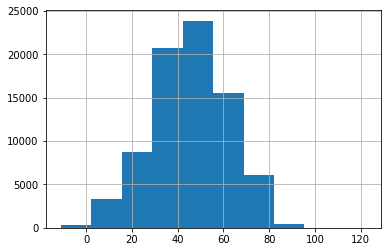

In [13]:
raw_data1['Age'].hist()

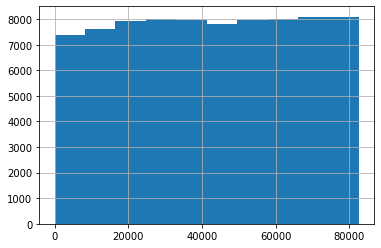

In [12]:
raw_data1['ID'].hist()

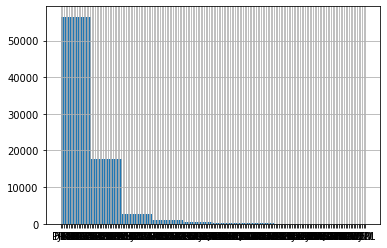

In [11]:
raw_data1['Nationality'].hist()

In [14]:
colors = ['red','blue', 'orange']
DistributionChannel = ['Travel Agent/Operator', 'Corporate', 'Direct']

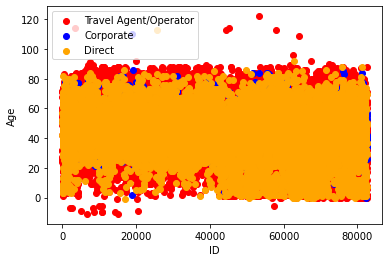

In [15]:
#Scatterplot
for i in range(3):
  x = raw_data1[raw_data1['DistributionChannel']== DistributionChannel[i]]
  plt.scatter(x['ID'], x['Age'], c = colors[i], label=DistributionChannel[i])
  plt.xlabel('ID')
  plt.ylabel('Age')
  plt.legend()

In [16]:
#coloring the scatterplot
colors = ['red','blue', 'orange', 'black', 'purple','green']
MarketSegment = ['Other', 'Corporate', 'Travel Agent/Operator','Aviation','Complementary']

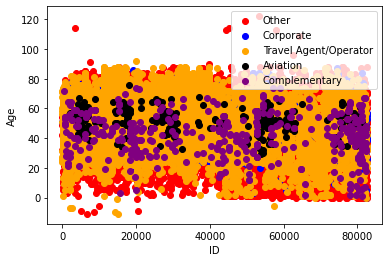

In [17]:
for i in range(5):
  x =raw_data1[raw_data1['MarketSegment']== MarketSegment[i]]
  plt.scatter(x['ID'], x['Age'], c = colors[i], label=MarketSegment[i]) 
  plt.xlabel('ID')
  plt.ylabel('Age')
  plt.legend()


In [18]:
#Correlation Matrix
raw_data1.corr()

,Unnamed: 0,ID,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,...,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
Unnamed: 0,1.000000,1.000000,-0.128368,-0.986776,-0.146148,-0.099166,-0.163090,-0.016796,-0.011906,-0.279482,...,-0.005862,0.006843,0.004156,0.038162,0.022227,0.019185,0.000655,-0.010846,0.012300,0.047437
ID,1.000000,1.000000,-0.128368,-0.986776,-0.146148,-0.099166,-0.163090,-0.016796,-0.011906,-0.279482,...,-0.005862,0.006843,0.004156,0.038162,0.022227,0.019185,0.000655,-0.010846,0.012300,0.047437
Age,-0.128368,-0.128368,1.000000,0.125970,0.251712,0.051373,0.116581,0.004446,0.006721,0.130474,...,0.007169,-0.017266,0.010652,-0.117421,-0.003077,0.013670,0.012988,0.009559,-0.010679,0.014094
DaysSinceCreation,-0.986776,-0.986776,0.125970,1.000000,0.134294,0.090162,0.157007,0.016700,0.012102,0.272285,...,0.006484,-0.009585,-0.005274,-0.035947,-0.025467,-0.022719,-0.001697,0.011394,-0.011354,-0.049042
AverageLeadTime,-0.146148,-0.146148,0.251712,0.134294,1.000000,0.217474,0.242221,-0.014656,-0.011521,0.243048,...,-0.000850,-0.007210,0.008272,-0.040311,-0.017878,0.078178,0.000143,-0.000295,-0.006525,0.007338
LodgingRevenue,-0.099166,-0.099166,0.051373,0.090162,0.217474,1.000000,0.537068,0.063528,0.060418,0.406006,...,0.005677,0.003203,0.012062,-0.017372,0.009343,0.006604,0.004302,0.011950,-0.001103,0.052833
OtherRevenue,-0.163090,-0.163090,0.116581,0.157007,0.242221,0.537068,1.000000,0.044486,0.033859,0.302791,...,0.007840,0.007853,0.011885,0.001678,0.011037,0.012283,0.001084,0.012175,0.005068,0.016855
BookingsCanceled,-0.016796,-0.016796,0.004446,0.016700,-0.014656,0.063528,0.044486,1.000000,0.328430,0.471273,...,0.024849,-0.001511,-0.001194,-0.003221,0.018618,-0.008244,-0.000501,0.004680,-0.000317,-0.005543
BookingsNoShowed,-0.011906,-0.011906,0.006721,0.012102,-0.011521,0.060418,0.033859,0.328430,1.000000,0.289987,...,-0.000611,-0.001101,-0.000870,-0.002346,0.012653,-0.002042,-0.000365,-0.001234,-0.000231,-0.003362
BookingsCheckedIn,-0.279482,-0.279482,0.130474,0.272285,0.243048,0.406006,0.302791,0.471273,0.289987,1.000000,...,0.011230,-0.005422,-0.000054,-0.035915,0.008983,-0.026779,0.001117,0.009461,-0.004832,-0.008989


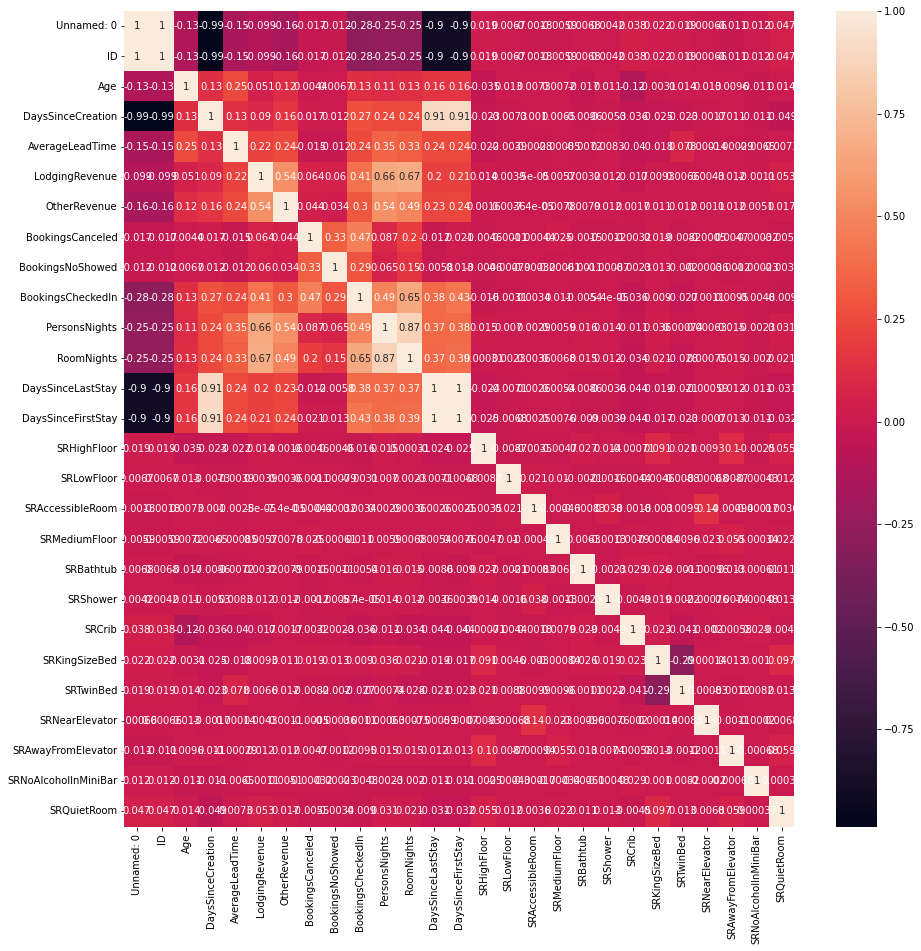

In [21]:
corr = raw_data1.corr()
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(corr, annot=True, ax=ax)

In [22]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
data_pre1 = raw_data1.copy()
le = LabelEncoder()
data_pre1['Nationality'] = le.fit_transform(data_pre1['Nationality'])
data_pre1['DistributionChannel'] = le.fit_transform(data_pre1['DistributionChannel'])
data_pre1['MarketSegment'] = le.fit_transform(data_pre1['MarketSegment'])
x2 = data_pre1[['LodgingRevenue', 'OtherRevenue', 'SRHighFloor', 'SRLowFloor', 'SRAccessibleRoom','SRMediumFloor','SRBathtub','SRShower','SRCrib','SRKingSizeBed','SRTwinBed','SRNearElevator','SRAwayFromElevator','SRNoAlcoholInMiniBar','SRQuietRoom']] 
y2 = data_pre1['BookingsCheckedIn']

In [23]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_test = sc.fit_transform(x2)

In [24]:
y_pred = ann.predict(X_test)

In [25]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
table_predict = pd.DataFrame()
table_predict['actual'] = y2
table_predict['predict'] = np.round(ann.predict(X_test))
cm = confusion_matrix(table_predict['actual'], table_predict['predict'])
print(cm)
accuracy = accuracy_score(table_predict['actual'], table_predict['predict'])
print(accuracy)
print('Accuracy The Model :', np.round(accuracy, 2) * 100, '%')

[[18455   116     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0]
 [  199 58721     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0]
 [    8  1051     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0]
 [    2   116     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0]
 [    2    54     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0]
 [    0    20     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0  

In [26]:
table_predict

,actual,predict
0,3,1.0
1,0,0.0
2,1,1.0
3,0,0.0
4,1,1.0
...,...,...
78829,1,1.0
78830,1,1.0
78831,0,0.0
78832,1,1.0


In [27]:
ann.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 6)                 96        
                                                                 
 dense_1 (Dense)             (None, 6)                 42        
                                                                 
 dense_2 (Dense)             (None, 1)                 7         
                                                                 
Total params: 145
Trainable params: 145
Non-trainable params: 0
_________________________________________________________________


**Method 1: plot_model from tf**

In [28]:
from tensorflow.keras.utils import plot_model


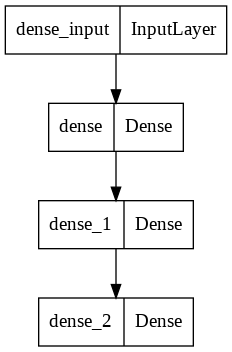

In [29]:
plot_model(ann, to_file='Hotel_ann.png', show_shapes=False)

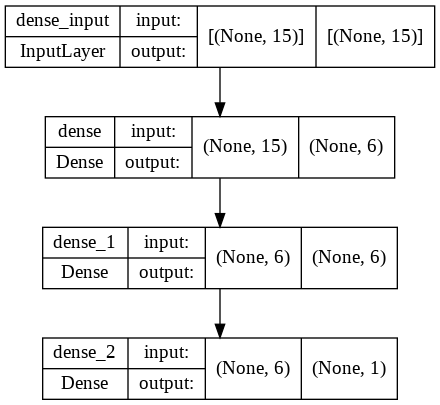

In [30]:
# Visualize with show nodes
plot_model(ann, to_file='Hotel_ann.png', show_shapes=True)

**Method 2: Ann_visualizer**

In [31]:
!pip install ann_visualizer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for ann-visualizer: filename=ann_visualizer-2.5-py3-none-any.whl size=4168 sha256=ee7d7992a3d4fd749c95bbe579e315edcad8033c94e39037cf78ce16813cb5a0
  Stored in directory: /root/.cache/pip/wheels/1b/fc/58/2ab1c3b30350105929308becddda4fb59b1358e54f985e1f4a
Successfully built ann-visualizer


In [32]:
from ann_visualizer.visualize import ann_viz
import graphviz

In [33]:
ann_viz(ann, filename="test_data_evaluation_part_2(1).gv", title="Hotel Neural Network")


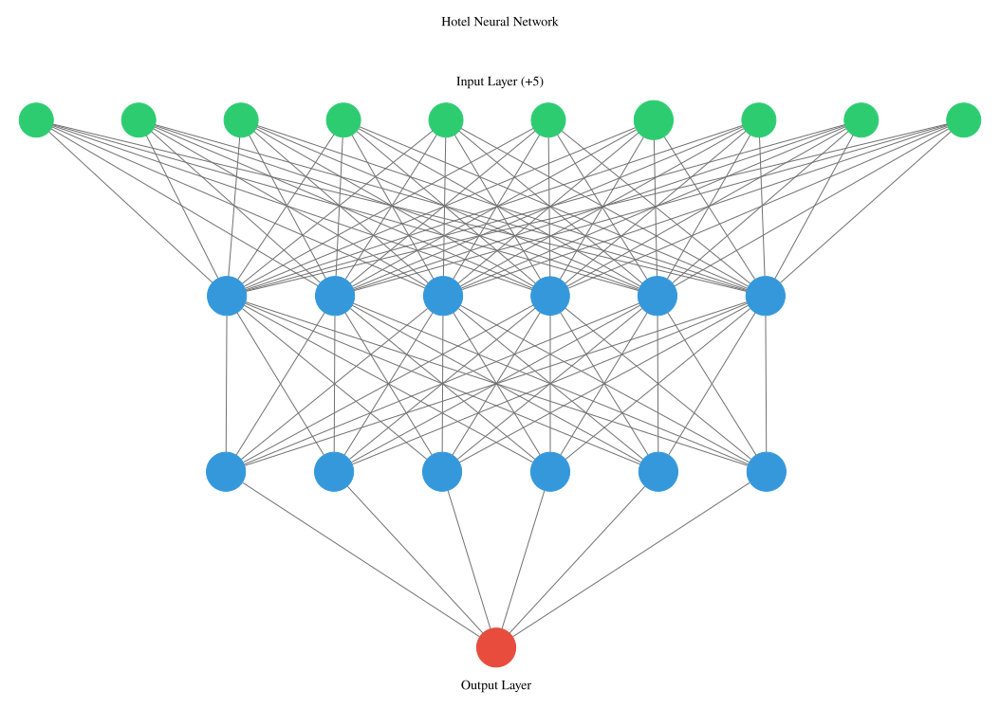

In [34]:
graph_file = graphviz.Source.from_file('test_data_evaluation_part_2(1).gv')
graph_file

**Method 3: tensorboard**



In [35]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [36]:
%load_ext tensorboard

In [37]:
#creating a folder
log_folder = 'logs'

In [38]:
#callbacks
from tensorflow.keras.callbacks import TensorBoard

In [39]:
#specify callbacks
callbacks = TensorBoard(log_dir=log_folder,histogram_freq=1)

In [40]:
ann.fit(X_train,y,batch_size=32,epochs =100,verbose=0,callbacks=callbacks)

In [48]:
%tensorboard --logdir={log_folder}

Reusing TensorBoard on port 6006 (pid 1948), started 0:00:17 ago. (Use '!kill 1948' to kill it.)

<IPython.core.display.Javascript object>

In [42]:
pip install streamlit -q

     |████████████████████████████████| 9.1 MB 5.2 MB/s 
     |████████████████████████████████| 4.3 MB 43.9 MB/s 
     |████████████████████████████████| 181 kB 47.7 MB/s 
     |████████████████████████████████| 164 kB 39.1 MB/s 
     |████████████████████████████████| 235 kB 37.1 MB/s 
     |████████████████████████████████| 78 kB 5.5 MB/s 
     |████████████████████████████████| 63 kB 527 kB/s 
     |████████████████████████████████| 132 kB 70.8 MB/s 
     |████████████████████████████████| 793 kB 54.1 MB/s 
     |████████████████████████████████| 423 kB 45.0 MB/s 
     |████████████████████████████████| 132 kB 59.9 MB/s 
     |████████████████████████████████| 381 kB 45.1 MB/s 
     |████████████████████████████████| 51 kB 7.0 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
nbclient 0.6.6 requires traitlets>=5.2.2, but you have traitlets 5.1.1 which i

In [43]:
table_predict.to_csv('predict.csv')

In [44]:
%%writefile app.py
#!pip install ann_visualizer
import pandas as pd
import streamlit as st
raw_data1 = pd.read_csv('/content/predict.csv')
st.dataframe(data=raw_data1)

Writing app.py


In [51]:
!streamlit run app.py & npx localtunnel --port 8501

2022-08-09 13:33:03.878 INFO    numexpr.utils: NumExpr defaulting to 2 threads.

  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.2:8501
  External URL: http://34.148.188.177:8501

npx: installed 22 in 3.032s
your url is: https://every-eels-kick-34-148-188-177.loca.lt
  Stopping...
^C
